**Technical Training Project**
-22EG107B42-Nithin Kumar Singarapu

**implementing Object Detection for  Blindspot object detection in cars.**

*this model can detect humans,signboards,cars,bicycles,bikes,etc*

The Dataset is downloaded from ROBOFLOW UNIVERSE.

Using YOLOv9 object detection architecture, the custom model is trained on the dataset.

In [ ]:
#accessing to GPU
!nvidia-smi

Thu Apr 25 06:36:33 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   50C    P8              12W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [ ]:
#To make work easier with managing datasets using home constant
import os
HOME = os.getcwd()
print(HOME)

/content/yolov9


In [ ]:
#Cloning and installing YOLOv9
!git clone https://github.com/SkalskiP/yolov9.git
%cd yolov9
!pip install -r requirements.txt -q

Cloning into 'yolov9'...
remote: Enumerating objects: 325, done.
remote: Counting objects: 100% (325/325), done.
remote: Compressing objects: 100% (152/152), done.
remote: Total 325 (delta 165), reused 264 (delta 162), pack-reused 0
Receiving objects: 100% (325/325), 2.23 MiB | 2.80 MiB/s, done.
Resolving deltas: 100% (165/165), done.
/content/yolov9/yolov9


In [ ]:
#installing Roboflow package
!pip install -q roboflow

In [ ]:
#Downloading model weights
!wget -P {HOME}/weights -q https://github.com/WongKinYiu/yolov9/releases/download/v0.1/yolov9-c.pt
!wget -P {HOME}/weights -q https://github.com/WongKinYiu/yolov9/releases/download/v0.1/yolov9-e.pt
!wget -P {HOME}/weights -q https://github.com/WongKinYiu/yolov9/releases/download/v0.1/gelan-c.pt
!wget -P {HOME}/weights -q https://github.com/WongKinYiu/yolov9/releases/download/v0.1/gelan-e.pt

In [ ]:
#checking for model weights
!ls -la {HOME}/weights

total 402440
drwxr-xr-x  2 root root      4096 Apr 25 06:37 .
drwxr-xr-x 16 root root      4096 Apr 25 06:37 ..
-rw-r--r--  1 root root  51508261 Feb 18 12:36 gelan-c.pt
-rw-r--r--  1 root root 117203713 Feb 18 12:36 gelan-e.pt
-rw-r--r--  1 root root 103153312 Feb 18 12:36 yolov9-c.pt
-rw-r--r--  1 root root 140217688 Feb 18 12:36 yolov9-e.pt


In [ ]:
#Checking for model version available or not
%cd {HOME}/yolov9

/content/yolov9/yolov9


In [ ]:
#Loading the dataset and implementing blindspoot detection using the dataset downloaded from Roboflow
import roboflow

roboflow.login()

rf = roboflow.Roboflow()

!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="CvlSHXAILmJCNESXywUd")
project = rf.workspace("vit-chennai-japsi").project("blind-spot-detection-rnoyg")
version = project.version(4)
dataset = version.download("yolov9")


You are already logged into Roboflow. To make a different login,run roboflow.login(force=True).
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to BLIND-SPOT-DETECTION-4 in yolov9:: 100%|██████████| 1224/1224 [00:00<00:00, 6199.03it/s]


In [ ]:
#Training custom model on 6 epochs i.e iterations
%cd {HOME}/yolov9

!python train.py \
--batch 16 --epochs 6 --img 640 --device 0 --min-items 0 --close-mosaic 15 \
--data {dataset.location}/data.yaml \
--weights {HOME}/weights/gelan-c.pt \
--cfg models/detect/gelan-c.yaml \
--hyp hyp.scratch-high.yaml

/content/yolov9/yolov9
2024-04-25 06:39:42.150293: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-25 06:39:42.150361: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-25 06:39:42.151677: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-04-25 06:39:43.214038: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
train: weights=/content/yolov9/weights/gelan-c.pt, cfg=models/detect/gelan-c.yaml, data=/content/yolov9/yolov9/BLIND-SPOT-DETECTION-4/data.yaml, hyp=hyp.scratch-high.yaml, epochs=6, batch_size=16, imgsz=640, rect=False

In [ ]:
#Examining Training results
!ls {HOME}/yolov9/runs/train/exp/

confusion_matrix.png				    PR_curve.png	   val_batch0_pred.jpg
events.out.tfevents.1714027183.f5cfdbfa7c32.3055.0  R_curve.png		   val_batch1_labels.jpg
F1_curve.png					    results.csv		   val_batch1_pred.jpg
hyp.yaml					    results.png		   val_batch2_labels.jpg
labels_correlogram.jpg				    train_batch0.jpg	   val_batch2_pred.jpg
labels.jpg					    train_batch1.jpg	   weights
opt.yaml					    train_batch2.jpg
P_curve.png					    val_batch0_labels.jpg


In [ ]:
#validating our custom model
%cd {HOME}/yolov9

!python val.py \
--img 640 --batch 32 --conf 0.001 --iou 0.7 --device 0 \
--data {dataset.location}/data.yaml \
--weights {HOME}/yolov9/runs/train/exp/weights/best.pt

/content/yolov9/yolov9
val: data=/content/yolov9/yolov9/BLIND-SPOT-DETECTION-4/data.yaml, weights=['/content/yolov9/yolov9/runs/train/exp/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.7, max_det=300, task=val, device=0, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False, min_items=0
YOLOv5 🚀 1e33dbb Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
gelan-c summary: 467 layers, 25490373 parameters, 0 gradients, 102.9 GFLOPs
val: Scanning /content/yolov9/yolov9/BLIND-SPOT-DETECTION-4/valid/labels.cache... 122 images, 0 backgrounds, 0 corrupt: 100% 122/122 [00:00<?, ?it/s]
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid =

## Inference with Custom Model

In [ ]:
#Impleenting Object detecton model on the dataset
!python detect.py \
--img 1280 --conf 0.1 --device 0 \
--weights {HOME}/yolov9/runs/train/exp/weights/best.pt \
--source {dataset.location}/test/images

detect: weights=['/content/yolov9/yolov9/runs/train/exp/weights/best.pt'], source=/content/yolov9/yolov9/BLIND-SPOT-DETECTION-4/test/images, data=data/coco128.yaml, imgsz=[1280, 1280], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=0, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 1e33dbb Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
gelan-c summary: 467 layers, 25490373 parameters, 0 gradients, 102.9 GFLOPs
image 1/58 /content/yolov9/yolov9/BLIND-SPOT-DETECTION-4/test/images/000004_png.rf.312bea2e1299aa34883094da41ecf817.jpg: 1280x1280 1 Bicycles, 5 Cars, 1 Person, 1 Road, 1 Signboard, 1 Tree, 138.6ms
image 2/58 /content/yolov9/yolov9/BLIND-SPOT-DETECTION-4/test/images/000009_png.rf.03c02863

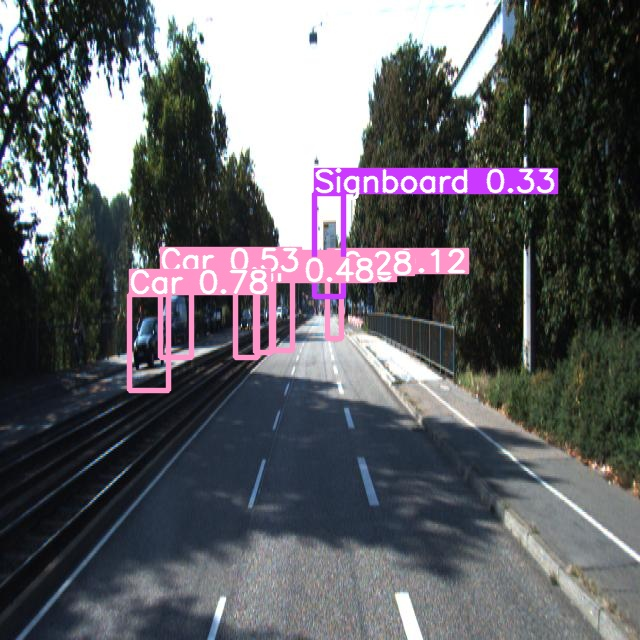

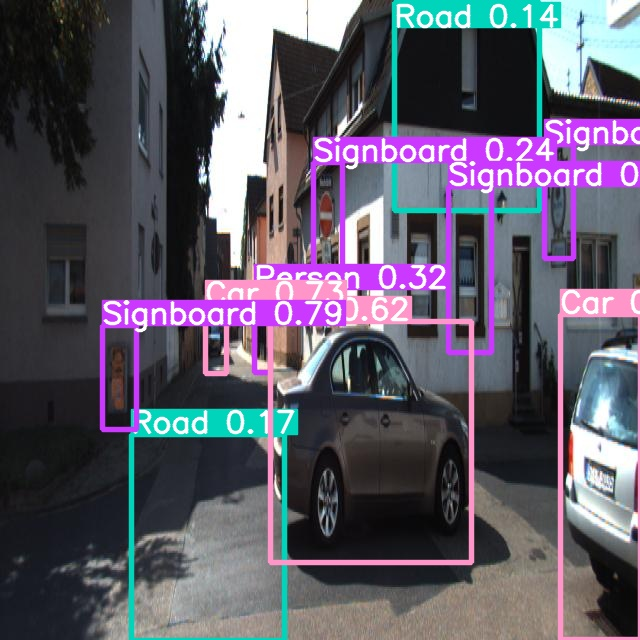

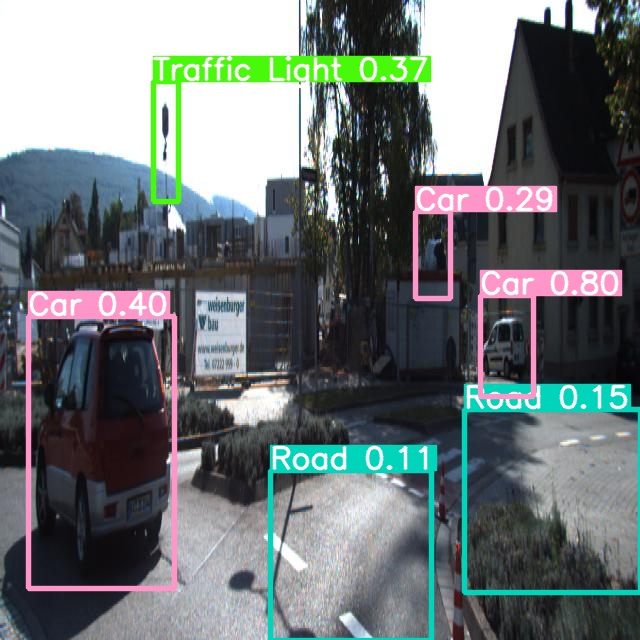

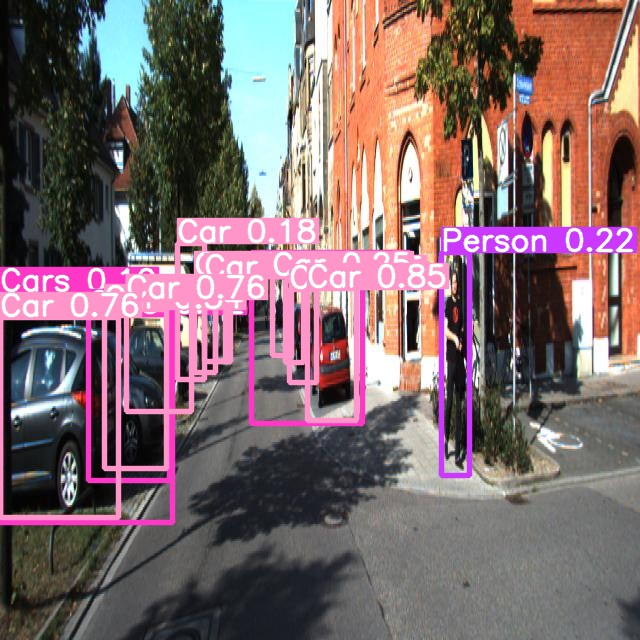

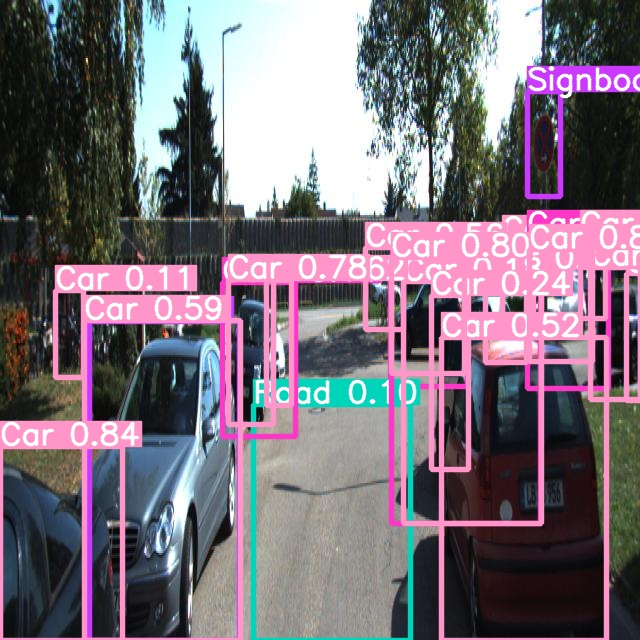

...

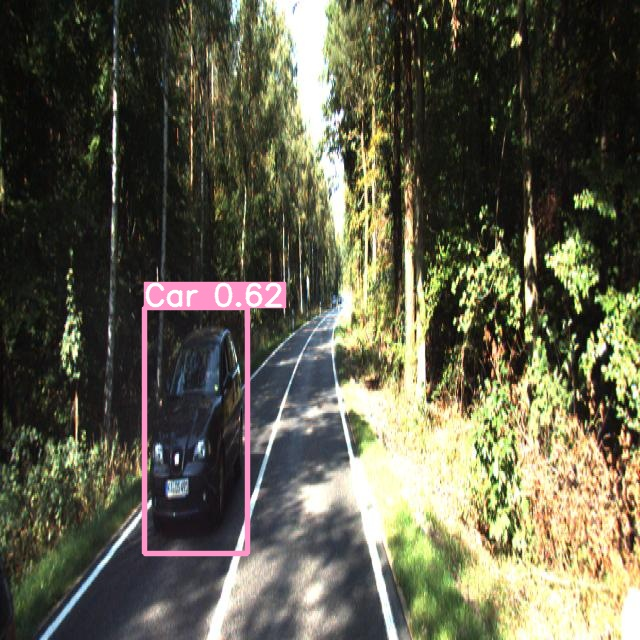

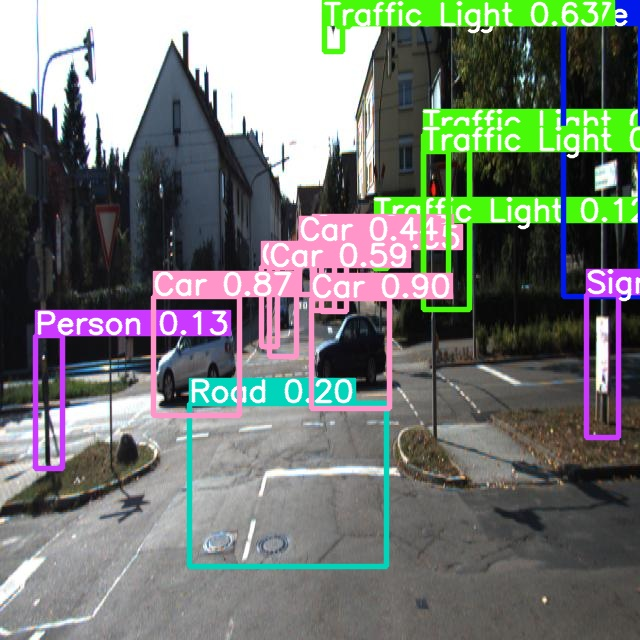

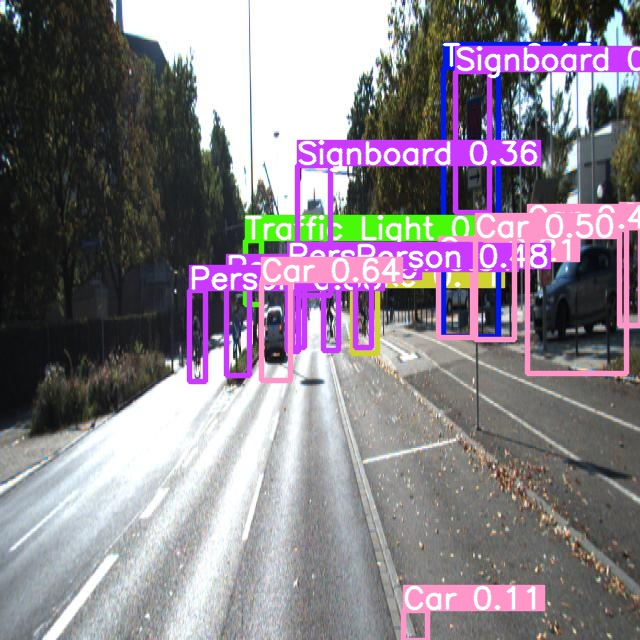

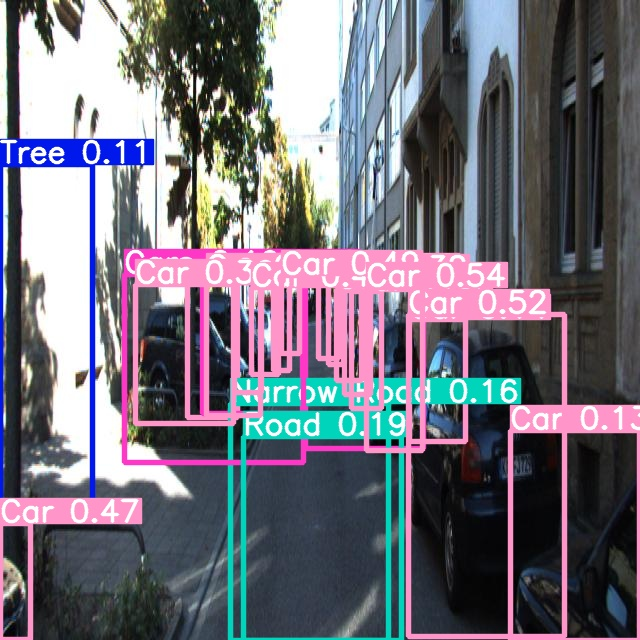

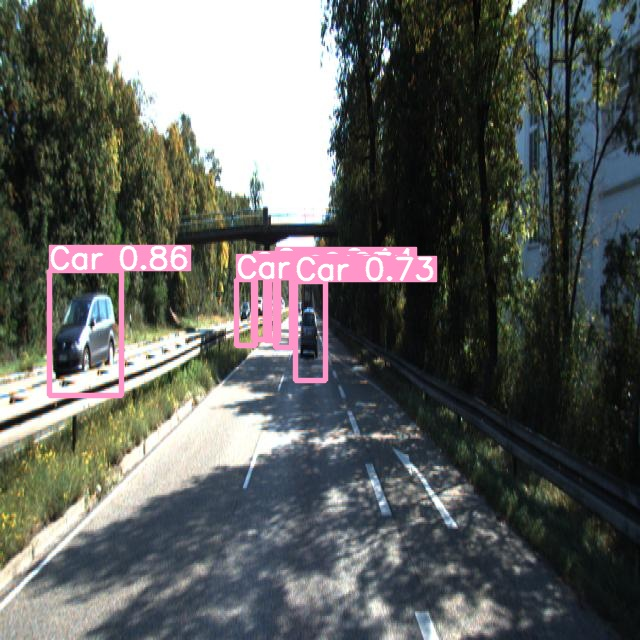

In [ ]:
#displaying the resulting images usimg glob
import glob

from IPython.display import Image, display

for image_path in glob.glob(f'{HOME}/yolov9/runs/detect/exp3/*.jpg')[:]:
      display(Image(filename=image_path, width=600))